# Análisis de datos de COVID-19 en el sitio web de CovidTracking



## Objetivos
El objetivo del análisis de datos es aprovechar la información disponible en el conjunto de datos de COVID Tracking para obtener conocimientos y generar insights relevantes que contribuyan a la comprensión de la evolución de la pandemia. A través de un enfoque riguroso y basado en datos, nuestro objetivo es identificar patrones, tendencias y relaciones significativas en los datos, con el fin de proporcionar una visión más completa y precisa del impacto de el COVID-19 durante ese periodo.

Mediante la aplicación de técnicas de exploración de datos, visualización y análisis estadístico, buscamos descubrir y comunicar información relevante que pueda contribuir a la generación de conocimiento y a la difusión de información precisa y confiable sobre la pandemia pasada. Pretendemos presentar los resultados de una manera accesible y comprensible, utilizando visualizaciones claras y efectivas, y resaltando los aspectos clave que emergen de los datos históricos.

Este proyecto tiene como objetivo fortalecer nuestras habilidades en el análisis de datos y la visualización, así como demostrar nuestra capacidad para utilizar herramientas y técnicas adecuadas para obtener resultados sólidos y confiables. Nuestro objetivo final es presentar un informe completo y bien estructurado que documente los hallazgos, conclusiones y recomendaciones derivadas del análisis de datos históricos de la pandemia de COVID-19.

Al finalizar, este informe servirá como una fuente valiosa de información para diferentes audiencias, incluyendo investigadores, académicos y el público en general interesado en comprender la evolución pasada de la pandemia. A través de este proyecto, esperamos contribuir al conocimiento acumulado sobre la COVID-19 y fomentar una mentalidad basada en datos para la toma de decisiones en futuras situaciones similares.



## Importación de librerías

En esta sección, se realizará la importación de las librerías necesarias para el análisis de datos en Python. Estas librerías, como Pandas, NumPy, Matplotlib y Seaborn, nos brindarán las herramientas esenciales para manipular, visualizar y analizar los datos de manera efectiva.

In [76]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import requests
import json
from datetime import datetime
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.layouts import gridplot
from datetime import datetime

## Importación de datos

En esta sección, se procederá a importar los datos necesarios para el análisis del proyecto. Se utilizará la función de lectura de datos de Pandas para cargar el conjunto de datos desde https://covidtracking.com/. A partir de aquí, se explorará y analizará la estructura de los datos para poder realizar las transformaciones y manipulaciones necesarias.

In [78]:
urldata = "https://api.covidtracking.com/v1/states/daily.csv"

def loaddata(url):
    try:
        df = pd.read_csv(url)
        return df
    except Exception as e:
        print(f"Error al obtener datos de {url}: {e}")
        return None

df = loaddata(urldata)

if df is not None:
    print("Datos cargados con exito")
else:
    print("Datos no cargados")


Datos cargados con exito


## Informacion de las columnas originales del dataframe

In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 56 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   date                         20780 non-null  object 
 1   state                        20780 non-null  object 
 2   positive                     20592 non-null  float64
 3   probableCases                9271 non-null   float64
 4   negative                     13290 non-null  float64
 5   pending                      2138 non-null   float64
 6   totalTestResultsSource       20780 non-null  object 
 7   totalTestResults             20614 non-null  float64
 8   hospitalizedCurrently        17339 non-null  float64
 9   hospitalizedCumulative       12382 non-null  float64
 10  inIcuCurrently               11636 non-null  float64
 11  inIcuCumulative              3789 non-null   float64
 12  onVentilatorCurrently        9126 non-null   float64
 13  onVentilatorCumu

## Modificamos el campo date para poder usarlo como fecha

In [83]:
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')
df['date'] = pd.to_datetime(df['date']).dt.date

df.head(5)

,date,state,positive,probableCases,negative,pending,totalTestResultsSource,totalTestResults,hospitalizedCurrently,hospitalizedCumulative,...,dataQualityGrade,deathIncrease,hospitalizedIncrease,hash,commercialScore,negativeRegularScore,negativeScore,positiveScore,score,grade
0,2021-03-07,AK,56886.0,NaN,NaN,NaN,totalTestsViral,1731628.0,33.0,1293.0,...,NaN,0,0,dc4bccd4bb885349d7e94d6fed058e285d4be164,0,0,0,0,0,NaN
1,2021-03-07,AL,499819.0,107742.0,1931711.0,NaN,totalTestsPeopleViral,2323788.0,494.0,45976.0,...,NaN,-1,0,997207b430824ea40b8eb8506c19a93e07bc972e,0,0,0,0,0,NaN
2,2021-03-07,AR,324818.0,69092.0,2480716.0,NaN,totalTestsViral,2736442.0,335.0,14926.0,...,NaN,22,11,50921aeefba3e30d31623aa495b47fb2ecc72fae,0,0,0,0,0,NaN
3,2021-03-07,AS,0.0,NaN,2140.0,NaN,totalTestsViral,2140.0,NaN,NaN,...,NaN,0,0,f77912d0b80d579fbb6202fa1a90554fc4dc1443,0,0,0,0,0,NaN
4,2021-03-07,AZ,826454.0,56519.0,3073010.0,NaN,totalTestsViral,7908105.0,963.0,57907.0,...,NaN,5,44,0437a7a96f4471666f775e63e86923eb5cbd8cdf,0,0,0,0,0,NaN


## Se exporta el dataframe a excel para hacer la exploracion de los datos 

In [40]:
df.to_excel('dataframe.xlsx', index=False)

## Mostramos la cantidad de registros null para cada columna

In [84]:
valores_nulos_por_columna = df.isnull().sum()
print(valores_nulos_por_columna)

date                               0
state                              0
positive                         188
probableCases                  11509
negative                        7490
pending                        18642
totalTestResultsSource             0
totalTestResults                 166
hospitalizedCurrently           3441
hospitalizedCumulative          8398
inIcuCurrently                  9144
inIcuCumulative                16991
onVentilatorCurrently          11654
onVentilatorCumulative         19490
recovered                       8777
lastUpdateEt                     616
dateModified                     616
checkTimeEt                      616
death                            850
hospitalized                    8398
hospitalizedDischarged         17710
dateChecked                      616
totalTestsViral                 6264
positiveTestsViral             11822
negativeTestsViral             15756
positiveCasesViral              6534
deathConfirmed                 11358
d

## Mostramos el porcentaje de registros null para cada columna

In [42]:
porcentaje_nulos = df.isnull().mean() * 100
print(porcentaje_nulos)

date                             0.000000
state                            0.000000
positive                         0.904716
probableCases                   55.384986
negative                        36.044273
pending                         89.711261
totalTestResultsSource           0.000000
totalTestResults                 0.798845
hospitalizedCurrently           16.559192
hospitalizedCumulative          40.413859
inIcuCurrently                  44.003850
inIcuCumulative                 81.766121
onVentilatorCurrently           56.082772
onVentilatorCumulative          93.792108
recovered                       42.237729
lastUpdateEt                     2.964389
dateModified                     2.964389
checkTimeEt                      2.964389
death                            4.090472
hospitalized                    40.413859
hospitalizedDischarged          85.226179
dateChecked                      2.964389
totalTestsViral                 30.144370
positiveTestsViral              56

In [19]:
# Calcula el porcentaje de valores nulos en cada columna
null_percentages = df.isnull().sum() / len(df)

# Filtra las columnas que tienen más del 80% de valores nulos
columns_to_drop = null_percentages[null_percentages > 0.8].index

# Crea un nuevo dataset sin las columnas filtradas
new_df = df.drop(columns=columns_to_drop)

# Calcula el porcentaje de valores nulos en cada columna
null_percentages = df.isnull().sum() / len(df)

# Filtra las columnas que tienen entre el 50% y el 19% de valores nulos
columns_to_check = null_percentages[(null_percentages < 0.79) & (null_percentages > 0.5)].index

# Imprime las columnas que cumplen la condición
print("Columnas con entre 50% y 79% de valores nulos:")
for column in columns_to_check:
    print(column)
    
    
    # Imprimir el resultado
print("\nPorcentaje de valores nulos por columna:")
print(porcentaje_nulos)



Columnas con entre 50% y 79% de valores nulos:
probableCases
onVentilatorCurrently
positiveTestsViral
negativeTestsViral
deathConfirmed
deathProbable
totalTestEncountersViral
totalTestsPeopleViral
totalTestsAntibody

Porcentaje de valores nulos por columna:
date                             0.000000
state                            0.000000
positive                         0.904716
probableCases                   55.384986
negative                        36.044273
pending                         89.711261
totalTestResultsSource           0.000000
totalTestResults                 0.798845
hospitalizedCurrently           16.559192
hospitalizedCumulative          40.413859
inIcuCurrently                  44.003850
inIcuCumulative                 81.766121
onVentilatorCurrently           56.082772
onVentilatorCumulative          93.792108
recovered                       42.237729
lastUpdateEt                     2.964389
dateModified                     2.964389
checkTimeEt                 

In [10]:
# Lista de columnas a eliminar
columnas_a_eliminar = ['probableCases', 'positiveTestsViral','negativeTestsViral',
                       'totalTestEncountersViral', 'totalTestsPeopleViral', 'totalTestsAntibody']

# Crear un nuevo DataFrame excluyendo las columnas especificadas
nw_df = new_df.drop(columns=columnas_a_eliminar)

# Imprimir el nuevo DataFrame
print(nw_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20780 entries, 0 to 20779
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   date                      20780 non-null  int64  
 1   state                     20780 non-null  object 
 2   positive                  20592 non-null  float64
 3   negative                  13290 non-null  float64
 4   totalTestResultsSource    20780 non-null  object 
 5   totalTestResults          20614 non-null  float64
 6   hospitalizedCurrently     17339 non-null  float64
 7   hospitalizedCumulative    12382 non-null  float64
 8   inIcuCurrently            11636 non-null  float64
 9   onVentilatorCurrently     9126 non-null   float64
 10  recovered                 12003 non-null  float64
 11  lastUpdateEt              20164 non-null  object 
 12  dateModified              20164 non-null  object 
 13  checkTimeEt               20164 non-null  object 
 14  death 

## Cargamos los nombre de los estados en el dataframe

In [85]:
state_codes = {
    'AK': 'Alaska',
    'AL': 'Alabama',
    'AR': 'Arkansas',
    'AS': 'American Samoa',
    'AZ': 'Arizona',
    'CA': 'California',
    'CO': 'Colorado',
    'CT': 'Connecticut',
    'DC': 'District of Columbia',
    'DE': 'Delaware',
    'FL': 'Florida',
    'GA': 'Georgia',
    'GU': 'Guam',
    'HI': 'Hawaii',
    'IA': 'Iowa',
    'ID': 'Idaho',
    'IL': 'Illinois',
    'IN': 'Indiana',
    'KS': 'Kansas',
    'KY': 'Kentucky',
    'LA': 'Louisiana',
    'MA': 'Massachusetts',
    'MD': 'Maryland',
    'ME': 'Maine',
    'MI': 'Michigan',
    'MN': 'Minnesota',
    'MO': 'Missouri',
    'MP': 'Northern Mariana Islands',
    'MS': 'Mississippi',
    'MT': 'Montana',
    'NC': 'North Carolina',
    'ND': 'North Dakota',
    'NE': 'Nebraska',
    'NH': 'New Hampshire',
    'NJ': 'New Jersey',
    'NM': 'New Mexico',
    'NV': 'Nevada',
    'NY': 'New York',
    'OH': 'Ohio',
    'OK': 'Oklahoma',
    'OR': 'Oregon',
    'PA': 'Pennsylvania',
    'PR': 'Puerto Rico',
    'RI': 'Rhode Island',
    'SC': 'South Carolina',
    'SD': 'South Dakota',
    'TN': 'Tennessee',
    'TX': 'Texas',
    'UT': 'Utah',
    'VA': 'Virginia',
    'VI': 'Virgin Islands',
    'VT': 'Vermont',
    'WA': 'Washington',
    'WI': 'Wisconsin',
    'WV': 'West Virginia',
    'WY': 'Wyoming'
}
df['state'] = df['state'].map(state_codes)


# Analisis de la informacion


### Un viaje a través del tiempo: la pandemia que impactó a los Estados Unidos

La pandemia de COVID-19 ha tenido un impacto profundo en los Estados Unidos. En este artículo, analizaremos los datos oficiales recopilados día a día en cada estado, para explorar cómo la propagación del virus ha afectado de manera única y dinámica a diferentes regiones del país.

## Los primeros casos
Los primeros casos de COVID-19 en los Estados Unidos se registraron en enero y febrero de 2020. Los casos se concentraron inicialmente en estados con  una gran población y densidad de ciudades importantes, lo que contribuyó a la rápida propagación del virus en las primeras etapas. 

Podemos comprobar esta informacion en la siguiente tabla que nos muestra la fecha del primer caso en cada estado

In [86]:
from tabulate import tabulate

# Ordenar el dataframe por fecha
df_sorted = df.sort_values(by=['date'])

# Filtrar solo los primeros casos de cada estado
first_cases = df_sorted.drop_duplicates(subset='state', keep='first')

# Calcular el número de columnas necesarias
num_columns = int(np.ceil(len(first_cases) / 10))

# Dividir el DataFrame en trozos más pequeños
split_dfs = np.array_split(first_cases, num_columns)

# Crear una lista de tablas en formato HTML para cada columna
tables = [tabulate(df[['state', 'date']], headers='keys', tablefmt='html', showindex=False) for df in split_dfs]

# Crear el código HTML para mostrar las tablas en columnas
html_code = "<div style='display: flex;'>"
for table in tables:
    html_code += f"<div style='flex: 1; margin-right: 20px;'>{table}</div>"
html_code += "</div>"

# Mostrar las tablas en columnas utilizando HTML
display(HTML(html_code))



state,date
Washington,2020-01-13
Massachusetts,2020-01-22
Virginia,2020-01-27
Florida,2020-01-29
New Jersey,2020-02-10
Nebraska,2020-02-15
Indiana,2020-02-27
Connecticut,2020-02-29
Michigan,2020-03-01
Rhode Island,2020-03-01


## Tendencia de casos positivos con el tiempo
A medida que la pandemia avanzaba, se pudo notar una curva exponencial en el número de casos positivos, lo que indicaba una rápida y sostenida propagación del virus. Los estados informaban aumentos diarios significativos en los casos confirmados, y la situación evolucionaba rápidamente.

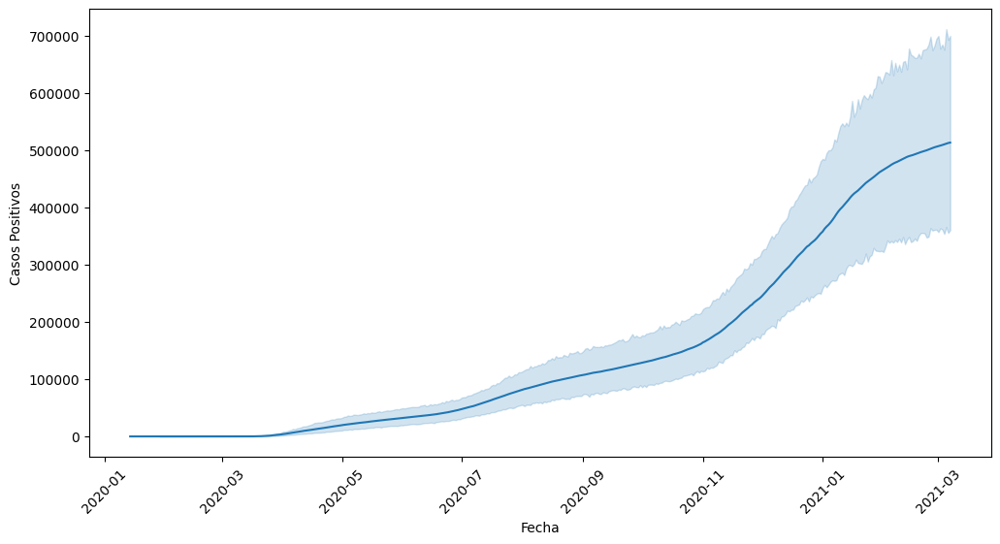

In [87]:
plt.figure(figsize=(12, 6))
sns.lineplot(x='date', y='positive', data=df)
plt.title('')
plt.xlabel('Fecha')
plt.ylabel('Casos Positivos')
plt.xticks(rotation=45)
plt.show()

## Casos Positivos de COVID-19 por Estado

Al observar los datos, es evidente que algunos estados fueron afectados más gravemente que otros, con mayores números de casos positivos y brotes más extensos. Estados como California, Texas y Florida emergieron como puntos críticos de la pandemia debido a su alta población, centros urbanos densamente poblados y flujos de viaje internacionales.

El análisis de los casos positivos por estado ha sido fundamental para informar la toma de decisiones a nivel local, estatal y federal, permitiendo identificar áreas de mayor riesgo y dirigir los recursos de manera más eficiente para controlar la propagación del virus y proteger la salud pública.

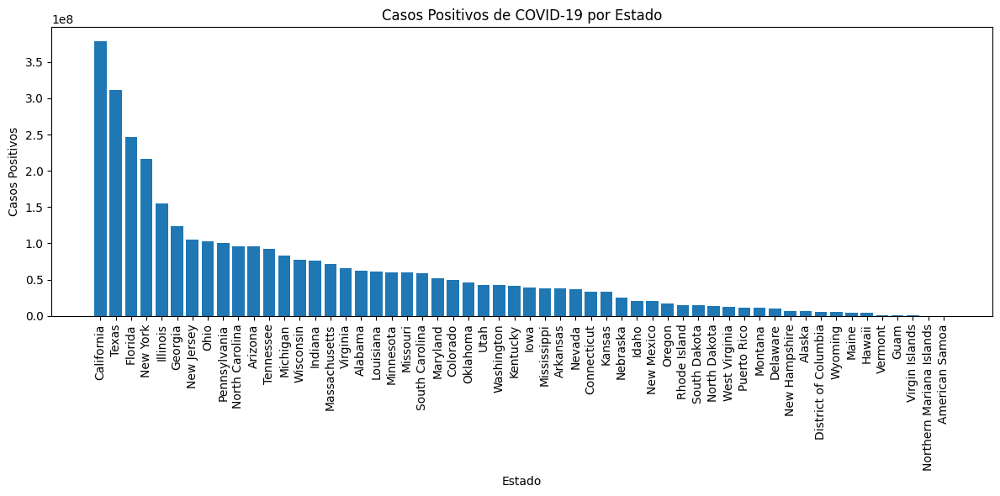

In [91]:
df_casos_por_estado = df[['state', 'positive']]

# Agrupar los datos por estado y sumar los casos positivos
casos_por_estado = df_casos_por_estado.groupby('state')['positive'].sum()

# Ordenar los estados por la cantidad de casos positivos de forma descendente
casos_por_estado = casos_por_estado.sort_values(ascending=False)

# Graficar los casos por estado
plt.figure(figsize=(12, 6))
plt.bar(casos_por_estado.index, casos_por_estado.values)
plt.xlabel('Estado')
plt.ylabel('Casos Positivos')
plt.title('Casos Positivos de COVID-19 por Estado')
plt.xticks(rotation=90)  # Rotar los nombres de los estados para que sean legibles
plt.tight_layout()
plt.show()

## Evolucion de casos detallada por estado 

Al examinar las gráficas, podemos observar cómo algunos estados experimentaron picos agudos en los casos diarios, reflejando momentos críticos en los que la transmisión del virus fue más intensa. Estos picos podrían estar asociados con eventos específicos, como brotes en instalaciones de cuidado de la salud, reuniones masivas o la relajación temporal de las medidas de distanciamiento social.

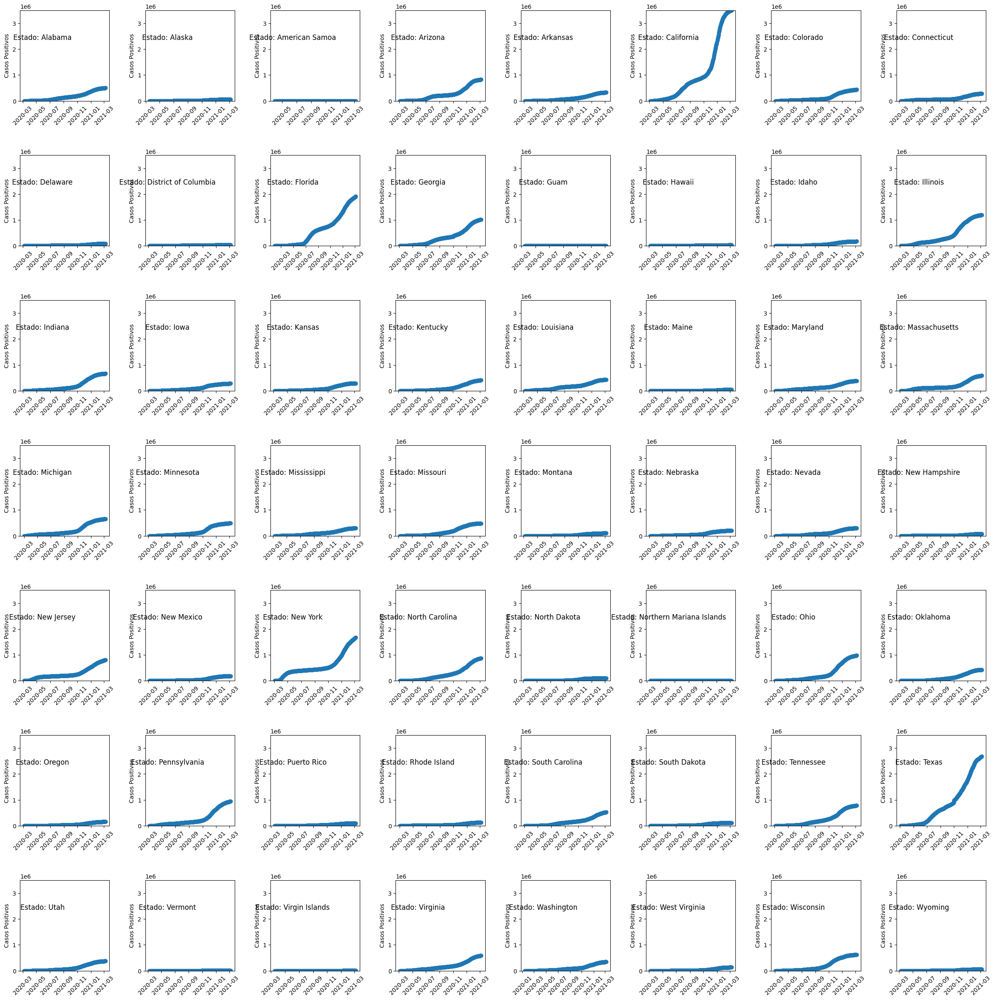

In [96]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Obtener la lista de estados únicos presentes en el DataFrame
estados = df['state'].unique()

# Definir el tamaño de la cuadrícula de subplots
filas = 7  # Puedes ajustar el número de filas según la cantidad de estados únicos
columnas = 8  # Puedes ajustar el número de columnas según la cantidad de estados únicos

# Crear una figura con el tamaño adecuado para contener la cuadrícula de subplots
plt.figure(figsize=(30, 30))

# Utilizar gridspec para crear una cuadrícula personalizada de subplots
grid = gridspec.GridSpec(filas, columnas, wspace=0.4, hspace=0.6)

# Establecer los límites del eje Y
ylim_min = df['positive'].min()
ylim_max = df['positive'].max()

# Iterar sobre los estados y generar un gráfico de líneas para cada uno
for i, estado in enumerate(estados):
    # Filtrar los datos para el estado actual
    data_estado = df[df['state'] == estado]
    
    # Ordenar los datos por fecha en orden ascendente
    data_estado = data_estado.sort_values(by='date')
    
    # Crear el subplot en la posición correspondiente en la cuadrícula
    ax = plt.subplot(grid[i])
    
    # Crear el gráfico de líneas para el estado actual
    ax.plot(data_estado['date'], data_estado['positive'], marker='o', linestyle='-')
    
    # Establecer los límites del eje Y para todos los gráficos
    ax.set_ylim(ylim_min, ylim_max)
    
    # Configurar el título del gráfico con el nombre del estado
    # ax.set_title(f'Estado: {estado}', pad=10)  # Ajustar el valor de pad para mover el título dentro del gráfico
    
    # Agregar etiqueta dentro del gráfico
    ax.text(0.25, 0.7, f'Estado: {estado}', transform=ax.transAxes, fontsize=12, ha='center', va='center')
    # Puedes ajustar los valores (0.5, 0.5) para cambiar la posición de la etiqueta dentro del gráfico
    
    # Configurar las etiquetas de los ejes
    ax.set_ylabel('Casos Positivos')
    
    # Rotar las etiquetas del eje x para una mejor visualización
    plt.setp(ax.get_xticklabels(), rotation=45)

# Mostrar la cuadrícula de subplots
# plt.tight_layout()  # Ajustar el diseño de la figura automáticamente
plt.show()

In [92]:
df = df.sort_values(by=['state', 'date'])
# Definimos una función para calcular los casos confirmados diarios
def calcular_casos_diarios(group):
    group['casos_confirmados_diarios_por_estado'] = group['positive'].diff()
    return group

# Agrupa los datos por estado y aplica la función para calcular los casos diarios

grouped_df = df.groupby('state').apply(calcular_casos_diarios)


# Restablecer el índice para evitar ambigüedad
grouped_df.reset_index(drop=True, inplace=True)

grouped_df
# Crear gráficas interactivas para cada estado utilizando Bokeh
output_notebook()

# Lista de estados
estados = grouped_df['state'].unique()


figuras = []

for estado in estados:
    data_estado = grouped_df[grouped_df['state'] == estado]
    
    source = ColumnDataSource(data=data_estado)
    
    p = figure(title=f'Evolución de Casos Confirmados Diarios en {estado}',
               x_axis_label='Fecha',
               y_axis_label='Casos Confirmados Diarios',
               x_axis_type='datetime',
               width=800,  # Utiliza width en lugar de plot_width
               height=400)  # Utiliza height en lugar de plot_height
    p.line('date', 'casos_confirmados_diarios_por_estado', source=source, line_width=2)
    # Añadir interacción de "hover" para mostrar detalles al pasar el cursor por encima de la línea
    hover = HoverTool()
    hover.tooltips = [('Fecha', '@date{%F}'), ('Casos Diarios', '@casos_confirmados_diarios_por_estado')]
    hover.formatters = {'@date': 'datetime'}
    p.add_tools(hover)
    figuras.append(p)
# Organizar las gráficas en un grid layout
grid_layout = gridplot([figuras], toolbar_location='above')

#  Mostrar las gráficas
show(grid_layout)

Loading BokehJS ...

## Relacion de casos positivos por muertes 

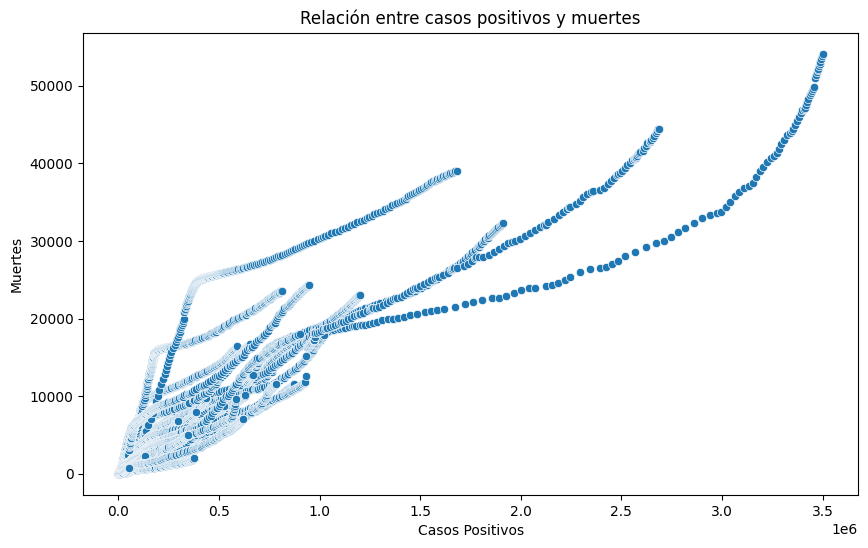

In [93]:
# Relación entre casos positivos y muertes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='positive', y='death', data=df)
plt.title('Relación entre casos positivos y muertes')
plt.xlabel('Casos Positivos')
plt.ylabel('Muertes')
plt.show()


## Identificamos la gráfica de American Samoa
Es una recta en 0, la exploramos más detalladamente y encontramos que si bien existen
357 registros para el estado AS, estos se encuentran vacíos.



In [98]:
state_AS = df.loc[df['state'] == 'American Samoa']
print(state_AS)
print(len(state_AS))
cantidad_valores_distintos = state_AS['positive'].nunique()
print (cantidad_valores_distintos)

             date           state  positive  probableCases  negative  pending  \
19939  2020-03-16  American Samoa       NaN            NaN       NaN      NaN   
19883  2020-03-17  American Samoa       NaN            NaN       NaN      NaN   
19827  2020-03-18  American Samoa       NaN            NaN       NaN      NaN   
19771  2020-03-19  American Samoa       NaN            NaN       NaN      NaN   
19715  2020-03-20  American Samoa       NaN            NaN       NaN      NaN   
...           ...             ...       ...            ...       ...      ...   
227    2021-03-03  American Samoa       0.0            NaN    2140.0      NaN   
171    2021-03-04  American Samoa       0.0            NaN    2140.0      NaN   
115    2021-03-05  American Samoa       0.0            NaN    2140.0      NaN   
59     2021-03-06  American Samoa       0.0            NaN    2140.0      NaN   
3      2021-03-07  American Samoa       0.0            NaN    2140.0      NaN   

      totalTestResultsSourc